In [1]:
import torch
import sys
import time

sys.path.append("/home/atuin/v120bb/v120bb18/UnReflectAnything")
from utilities.visualization import rgb, panelize
from polar_highlighter import PolarHighlighter

if torch.cuda.is_available():
    num_devices = torch.cuda.device_count()
    curr_device = torch.cuda.current_device()
    device_name = torch.cuda.get_device_name(curr_device)
    print(f"CUDA is available: {num_devices} device(s) detected.")
    print(f"Current device id: {curr_device} - {device_name}")
else:
    print("CUDA is not available")
%load_ext autoreload
%autoreload 2


CUDA is available: 1 device(s) detected.
Current device id: 0 - NVIDIA A40


In [11]:
from main import load_and_process_config
from models_utils import load_best_model_by_run
from dataset import from_config
from utilities import tensor_dict_summarize


config = load_and_process_config("config_train.yaml")
config.DATASETS = {"PSD": config.DATASETS.PSD}

dataset = from_config(config)["validation"]
dataset.return_filepaths = True
idataloadr = iter(torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False))


DATASET  [11:24:52] Processing 1 datasets: ['PSD']

DATASET  [11:24:52] Using dataset-specific TRAIN_SCENES for PSD: PSD_Train

DATASET  [11:24:52]   ✓ Created training dataset for PSD: 361 samples from specific scenes

DATASET  [11:24:52]   ✓ Created validation dataset for PSD: 471 samples from 7 scenes

DATASET  [11:24:52] === Dataset Creation Summary ===

DATASET  [11:24:52] Training:   361 total samples

DATASET  [11:24:52] Validation: 471 total samples

DATASET  [11:24:52] Test:       471 total samples

In [ ]:
MODEL_NAMES = [
    # "icy-gorge-754",
    "easy-surf-759",
    # "morning-energy-747"
    # "firm-firefly-771",
    # "zany-salad-770",
    # "cosmic-music-769",
    # "twilight-rain-768",
    # "fresh-gorge-766",
    # "classic-grass-765",
    # "stoic-waterfall-764",
    # "snowy-glade-763",
    # "earnest-resonance-761",
    # "young-monkey-760",
    # "true-planet-757",
    # "laced-moon-756",
]

INFO     [11:24:55] Found valid run to resume: /anvme/workspace/v120bb18-unreflectanything/results/icy-gorge-754

INFO     [11:24:55] Latest checkpoint: 
/anvme/workspace/v120bb18-unreflectanything/results/icy-gorge-754/models/weights_best.pt

INFO     [11:24:55] Latest epoch: 12

MODEL    [11:24:58] ✓ Decoder 'diffuse': Successfully loaded all 54 state dict keys from weights/rgb_decoder.pth

MODEL    [11:24:58] Loaded pre-trained decoder weights from weights/rgb_decoder.pth

MODEL    [11:24:58] Decoder 'diffuse' un-frozen due to DECODER_LR=0.0001

MODEL    [11:24:58] Decoder 'highlight' un-frozen due to DECODER_LR=0.0005

MODEL    [11:24:59] ✓ Token Inpainter: Successfully loaded all 78 state dict keys from weights/token_inpainter.pth

MODEL    [11:24:59] Loaded pretrained token inpainter weights from weights/token_inpainter.pth

INFO     [11:25:00] Found valid run to resume: /anvme/workspace/v120bb18-unreflectanything/results/easy-surf-759

INFO     [11:25:00] Latest checkpoint: 
/anvme/workspace/v120bb18-unreflectanything/results/easy-surf-759/models/weights_best.pt

INFO     [11:25:00] Latest epoch: 11

MODEL    [11:25:02] ✓ Decoder 'diffuse': Successfully loaded all 54 state dict keys from weights/rgb_decoder.pth

MODEL    [11:25:02] Loaded pre-trained decoder weights from weights/rgb_decoder.pth

MODEL    [11:25:02] Decoder 'diffuse' un-frozen due to DECODER_LR=0.0001

MODEL    [11:25:02] Decoder 'highlight' un-frozen due to DECODER_LR=0.0005

MODEL    [11:25:03] ✓ Token Inpainter: Successfully loaded all 78 state dict keys from weights/token_inpainter.pth

MODEL    [11:25:03] Loaded pretrained token inpainter weights from weights/token_inpainter.pth

INFO     [11:25:03] Found valid run to resume: 
/anvme/workspace/v120bb18-unreflectanything/results/morning-energy-747

INFO     [11:25:03] Latest checkpoint: 
/anvme/workspace/v120bb18-unreflectanything/results/morning-energy-747/models/weights_best.pt

INFO     [11:25:03] Latest epoch: 1

MODEL    [11:25:05] ✓ Decoder 'diffuse': Successfully loaded all 54 state dict keys from weights/rgb_decoder.pth

MODEL    [11:25:05] Loaded pre-trained decoder weights from weights/rgb_decoder.pth

MODEL    [11:25:05] Decoder 'diffuse' un-frozen due to DECODER_LR=0.0001

MODEL    [11:25:05] Decoder 'highlight' un-frozen due to DECODER_LR=0.0005

MODEL    [11:25:06] ✓ Token Inpainter: Successfully loaded all 78 state dict keys from weights/token_inpainter.pth

MODEL    [11:25:06] Loaded pretrained token inpainter weights from weights/token_inpainter.pth

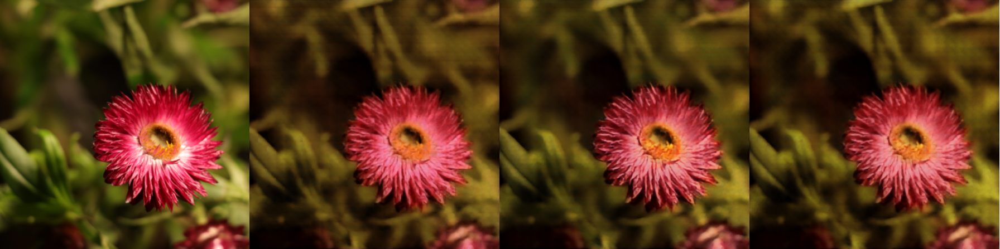

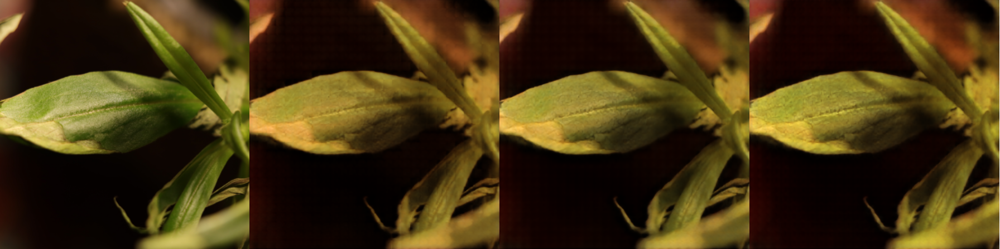

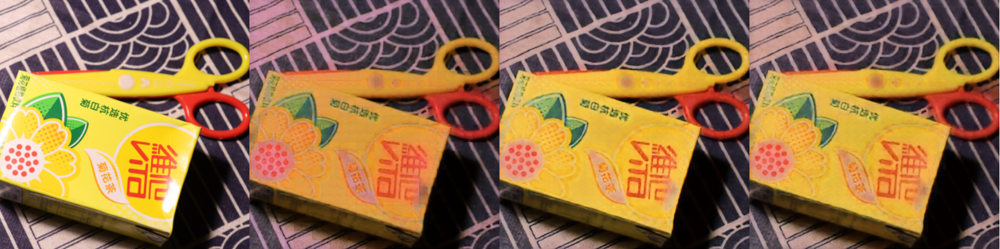

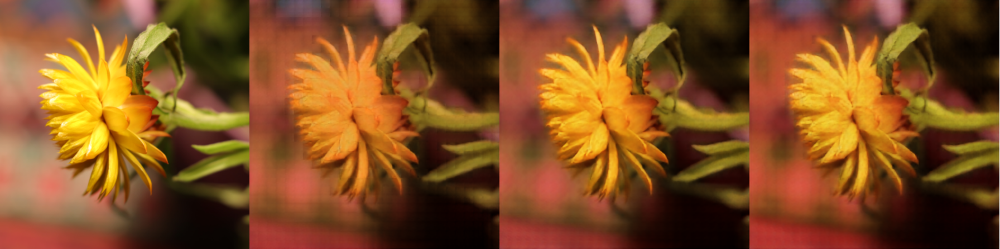

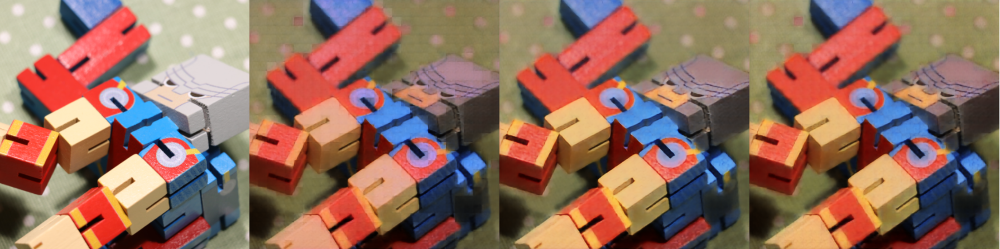

...

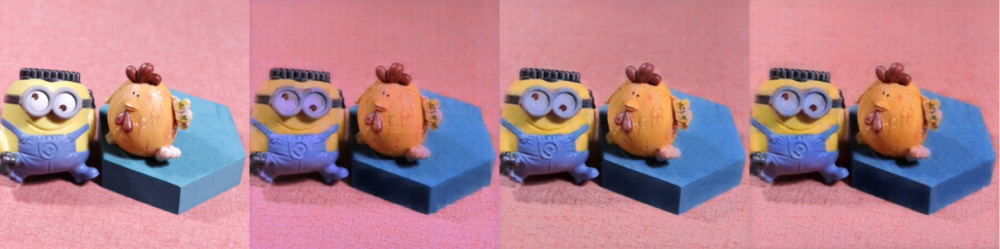

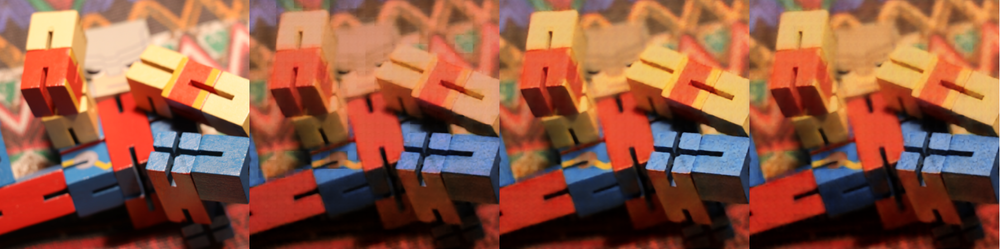

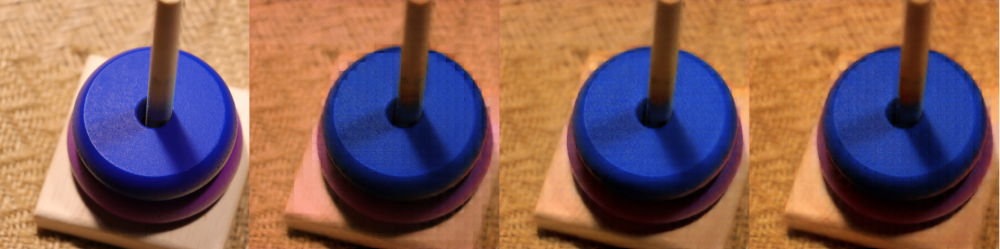

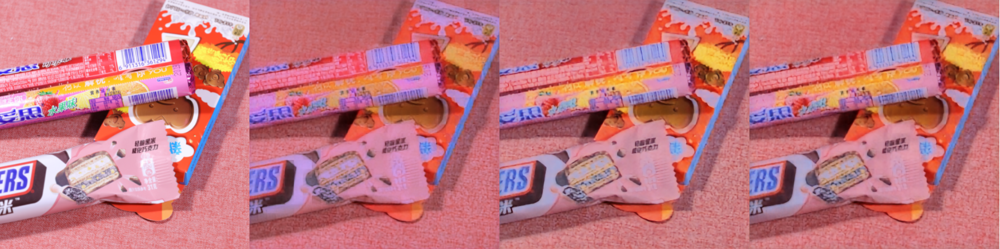

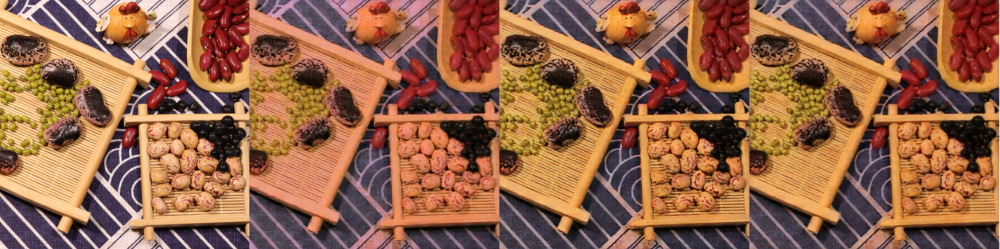

In [13]:
import importlib
import models

importlib.reload(models)
config = load_and_process_config("config_train.yaml")
torch.cuda.empty_cache()

MODELS = [load_best_model_by_run(model, verbose=False).eval() for model in MODEL_NAMES]
dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)
torch.cuda.empty_cache()
for b, batch in enumerate(dataloader):
    rgbs = [rgb(batch["raw"][0], as_tensor=True, resize=(448, 448))]
    for model, mname in zip(MODELS, MODEL_NAMES):
        batch = {
            k: v.cuda()
            if isinstance(v, torch.Tensor) and torch.cuda.is_available()
            else v
            for k, v in batch.items()
        }
        patch_mask = (
            batch["raw"].mean(dim=1, keepdim=True)
            > 0.9 * batch["raw"].mean(dim=1).max().item()
        )
        model_input = {"rgb": batch["raw"]}

        with torch.no_grad():
            modelout = model(model_input)
        rgbs.append(
            rgb(modelout["diffuse"][0], as_tensor=True, resize=(448, 448), title={"text":mname})
        )
    rgb(panelize(*rgbs))
    if b > 10:
    
        break


In [15]:
print(batch.keys())

dict_keys(['raw', 'diffuse', 'specular', 'intrinsics'])


In [ ]:
    _, pca = rgb(
        modelout["tokens_completed"][-1].reshape(1, 28, 28, 1024).permute(0, 3, 1, 2),
        as_tensor=True,
        resize=(448, 448),
        blackout=True,
        return_pca=True,
    )
    
    rgb(
        panelize(
            rgb(batch["raw"][0], as_tensor=True, resize=(448, 448)),
            # rgb(
            #     modelout["tokens_completed"][-1]
            #     .reshape(1, 28, 28, 1024)
            #     .permute(0, 3, 1, 2),
            #     as_tensor=True,
            #     pca=pca,
            #     resize=(448, 448),
            # ),
            # rgb(
            #     modelout["tokens_completed"][-1]
            #     .reshape(1, 28, 28, 1024)
            #     .permute(0, 3, 1, 2)
            #     * torch.logical_not(modelout["patch_mask"].reshape(1, 1, 28, 28)),
            #     as_tensor=True,
            #     resize=(448, 448),
            #     pca=pca,
            #     blackout=True,
            # ),
            rgb(modelout["diffuse"][0], as_tensor=True, resize=(448, 448)),
            rgb(modelout["highlight"][0], as_tensor=True, resize=(448, 448)),
        )
    )
    if b > 3:
        break


In [5]:
config = load_and_process_config("config_train.yaml")
config.RUN = "curious-moon-751"
config.DATASETS = {"PSD": config.DATASETS.PSD}
dataset = from_config(config)["validation"]
idataloadr = iter(torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False))
model = load_best_model_by_run(config.RUN).eval()
model.token_inpaint._prior_kernel = 5


In [6]:
print(model.token_inpaint._prior_kernel)

In [ ]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False)

for b, batch in enumerate(dataloader):
    batch = {
        k: v.cuda() if isinstance(v, torch.Tensor) and torch.cuda.is_available() else v
        for k, v in batch.items()
    }

    patch_mask = batch["raw"].mean(dim=1, keepdim=True) > 0.8
    model_input = {"rgb": batch["raw"]}  # , "inpaint_mask_override": patch_mask}

    with torch.no_grad():
        modelout = model(model_input)
    _, pca = rgb(
        modelout["tokens_completed"][-1].reshape(1, 28, 28, 1024).permute(0, 3, 1, 2),
        as_tensor=True,
        resize=(448, 448),
        blackout=True,
        return_pca=True,
    )
    rgb(
        panelize(
            rgb(batch["raw"][0], as_tensor=True, resize=(448, 448)),
            # rgb(
            #     modelout["tokens_completed"][-1]
            #     .reshape(1, 28, 28, 1024)
            #     .permute(0, 3, 1, 2),
            #     as_tensor=True,
            #     pca=pca,
            #     resize=(448, 448),
            # ),
            # rgb(
            #     modelout["tokens_completed"][-1]
            #     .reshape(1, 28, 28, 1024)
            #     .permute(0, 3, 1, 2)
            #     * torch.logical_not(modelout["patch_mask"].reshape(1, 1, 28, 28)),
            #     as_tensor=True,
            #     resize=(448, 448),
            #     pca=pca,
            #     blackout=True,
            # ),
            rgb(modelout["diffuse"][0], as_tensor=True, resize=(448, 448)),
            rgb(modelout["highlight"][0], as_tensor=True, resize=(448, 448)),
        )
    )
    if b > 3:
        break


In [ ]:
config = load_and_process_config("config_train.yaml")
config.RUN = "curious-moon-751"

# config.DATASETS = {"PSD": config.DATASETS.PSD}
# dataset = from_config(config)["validation"]
# idataloadr = iter(torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False))
model = load_best_model_by_run(config.RUN).eval()
# model.token_inpaint._prior_kernel = 11

dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=False)

for b, batch in enumerate(dataloader):
    batch = {
        k: v.cuda() if isinstance(v, torch.Tensor) and torch.cuda.is_available() else v
        for k, v in batch.items()
    }

    patch_mask = batch["raw"].mean(dim=1, keepdim=True) > 0.8
    model_input = {"rgb": batch["raw"]}  # , "inpaint_mask_override": patch_mask}

    with torch.no_grad():
        modelout = model(model_input)
    _, pca = rgb(
        modelout["tokens_completed"][-1].reshape(1, 28, 28, 1024).permute(0, 3, 1, 2),
        as_tensor=True,
        resize=(448, 448),
        blackout=True,
        return_pca=True,
    )
    rgb(
        panelize(
            rgb(batch["raw"][0], as_tensor=True, resize=(448, 448)),
            # rgb(
            #     modelout["tokens_completed"][-1]
            #     .reshape(1, 28, 28, 1024)
            #     .permute(0, 3, 1, 2),
            #     as_tensor=True,
            #     pca=pca,
            #     resize=(448, 448),
            # ),
            # rgb(
            #     modelout["tokens_completed"][-1]
            #     .reshape(1, 28, 28, 1024)
            #     .permute(0, 3, 1, 2)
            #     * torch.logical_not(modelout["patch_mask"].reshape(1, 1, 28, 28)),
            #     as_tensor=True,
            #     resize=(448, 448),
            #     pca=pca,
            #     blackout=True,
            # ),
            rgb(modelout["diffuse"][0], as_tensor=True, resize=(448, 448)),
            rgb(modelout["highlight"][0], as_tensor=True, resize=(448, 448)),
        )
    )
    if b > 3:
        break


In [ ]:
# torch.save(model.token_inpaint.state_dict(), "/home/atuin/v120bb/v120bb18/UnReflectAnything/weights/token_inpainter.pth")